In [26]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mgimg
import matplotlib.colors as colors
import scipy as sp
import numpy as np
import emcee
import os 
from collections import namedtuple

import os 
os.chdir("/Users/fw23aao/brewsteretrieval/brewster_v1")

import settings
import utils
import test_module
import retrieval_run
import corner
import pickle as pickle
import TPmod
import brewtools
from IPython.display import display
%matplotlib inline

# MCMC

In [27]:
path = "/Users/fw23aao/brewsteretrieval/data/"

runname = "mcmc_test_G570D_clear"

# OK finish? 1 for yes, 0 for no.
fin = 1
flatendchain, flatendprobs,ndim = brewtools.get_endchain(runname,fin,path)
theta_max_end = flatendchain[np.argmax(flatendprobs)]
max_end_like = np.amax(flatendprobs)
samples = flatendchain

argfile =path+runname+"_runargs.pic"
runargs = brewtools.pickle_load(argfile)
settings.init(runargs)


with open(path+runname+'_configs.pkl', 'rb') as file:
    configs= pickle.load(file)
    
re_params=configs['re_params']
model_config_instance=configs['model_config']

maximum likelihood =  4318.889382140177
maximum likelihood in final 2K iterations=  4318.1613100465875


The chain is shorter than 50 times the integrated autocorrelation time for 25 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 1000;
tau: [1770.38892855 1371.94861039 1473.49587861 1840.1210108  1971.29770417
 1306.89598299 1993.05427328 2036.63357226 2422.85071365 1431.24118694
 1183.17519907 2399.05228728 1414.59325164 1415.35124353 1426.81358606
 1420.49144674 1418.57755156 1399.8480528  1423.36749876 1666.5193593
 1917.93667565 2132.3242162  2285.95360314 2256.69925917 2034.97762402]


Mean autocorrelation time: 1736.544 steps


In [28]:
print(theta_max_end)

[-3.24975571e+00 -1.08966147e+01 -5.59073670e+00 -3.22792743e+00
 -4.54551893e+00 -6.80993978e+00 -5.78542574e+00  5.19312713e+00
  1.77996549e-19  2.70795863e-03 -3.23258969e+01  1.35737498e+03
  2.39929719e+01  2.20856109e+01  2.85896698e+01  7.06754682e+01
  1.16878031e+02  1.93153185e+02  2.95539034e+02  4.71808063e+02
  6.85704076e+02  9.39068377e+02  1.25508187e+03  1.58848521e+03
  1.90528365e+03]


In [29]:
BIC = (-2.* max_end_like) + (ndim*np.log(runargs.obspec.shape[1]))
print("BIC = "+str(BIC))

BIC = -8488.41756852799


In [30]:
all_params,all_params_values =utils.get_all_parametres(re_params.dictionary) 
params_master = namedtuple('params',all_params)
params_instance = params_master(*theta_max_end)

intemp_keys = list(re_params.dictionary['pt']['params'].keys())

if runargs.proftype==1 or runargs.proftype==77:
    p_index_first=params_instance._fields.index(intemp_keys[1]) 
else:
    p_index_first=params_instance._fields.index(intemp_keys[0]) 
    
p_index_last=params_instance._fields.index(intemp_keys[-1])+1

Tsamples = samples[:,p_index_first:p_index_last]
nsamps = Tsamples.shape[0]
Tprofs = np.empty([64,Tsamples.shape[0]])
for i in range(0,nsamps):
    Tprofs[:,i] = TPmod.set_prof(runargs.proftype,runargs.coarsePress,runargs.press,Tsamples[i,:])
    
Tlays = np.empty([64,5])
for i in range(0,64):
    junk = Tprofs[i,:]
    junk2 = np.percentile(junk, [2.4,16, 50, 84,97.6],axis=0)
    junk3 = np.array(junk2)
    Tlays[i,:] = junk3[:]

Text(0.5, 0, 'T / K')

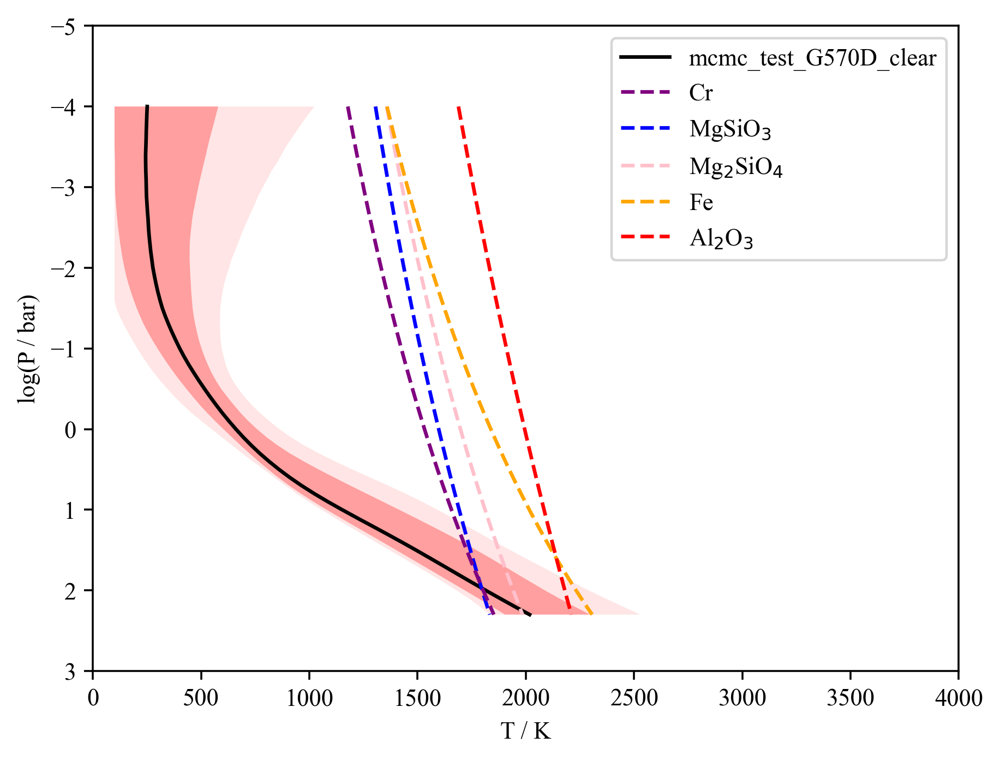

In [31]:
plt.rc('font',family='Times New Roman')
fig=plt.figure(dpi=320)
plt.axis([0., 4000.,3.0,-5.0])

logP = np.log10(runargs.press)

d1, = plt.plot(Tlays[:,2],logP,'k-',label=runname)
plt.fill_betweenx(logP,Tlays[:,1], Tlays[:,3], facecolor='red', alpha=0.3)
plt.fill_betweenx(logP,Tlays[:,0], Tlays[:,4], facecolor='red', alpha=0.1)

# Here are some condensation curves
enst = 10.0**4/(6.26 - 0.35*logP-0.70*0.0)
fost = 10.0**4/(5.89 - 0.37*logP-0.73*0.0)
iron = 10.0**4/(5.44 - 0.48*logP-0.48*0.0)
cr =  10.0**4/(6.528 - 0.491*logP-0.491*0.0)
al2o3 = 10.0**4 / (5.0139 - 0.21794*(logP) + 2.2636E-03*(logP)**2.0 - 0.580*0.0)
c1, = plt.plot(enst,logP,'--',color='blue',linewidth=1.5, label='MgSiO$_3$')
c2, = plt.plot(fost,logP,'--',color='pink',linewidth=1.5,label='Mg$_2$SiO$_4$')
c3, = plt.plot(iron,logP,'--',color='orange',linewidth=1.5, label='Fe')
c4, = plt.plot(cr,logP,'--',color='purple',linewidth=1.5, label='Cr')
c5, = plt.plot(al2o3,logP,'--',color='red',linewidth=1.5, label='Al$_2$O$_3$')

plt.legend(handles=[d1,c4,c1,c2,c3,c5])
plt.ylabel(r'log(P / bar)')
plt.xlabel('T / K')


In [32]:
D = 3.086e+16 * model_config_instance.dist

r2d2_index=params_instance._fields.index('r2d2')
r2d2 =theta_max_end[r2d2_index]


logg_index=params_instance._fields.index('logg')
logg =theta_max_end[logg_index]


if (r2d2 > 0.):
    R = np.sqrt(r2d2) * D
g = (10.**logg)/100.
M = (R**2 * g/(6.67E-11))/1.898E27
Rj = R / 69911.e3
print(Rj)

1.08759961693628


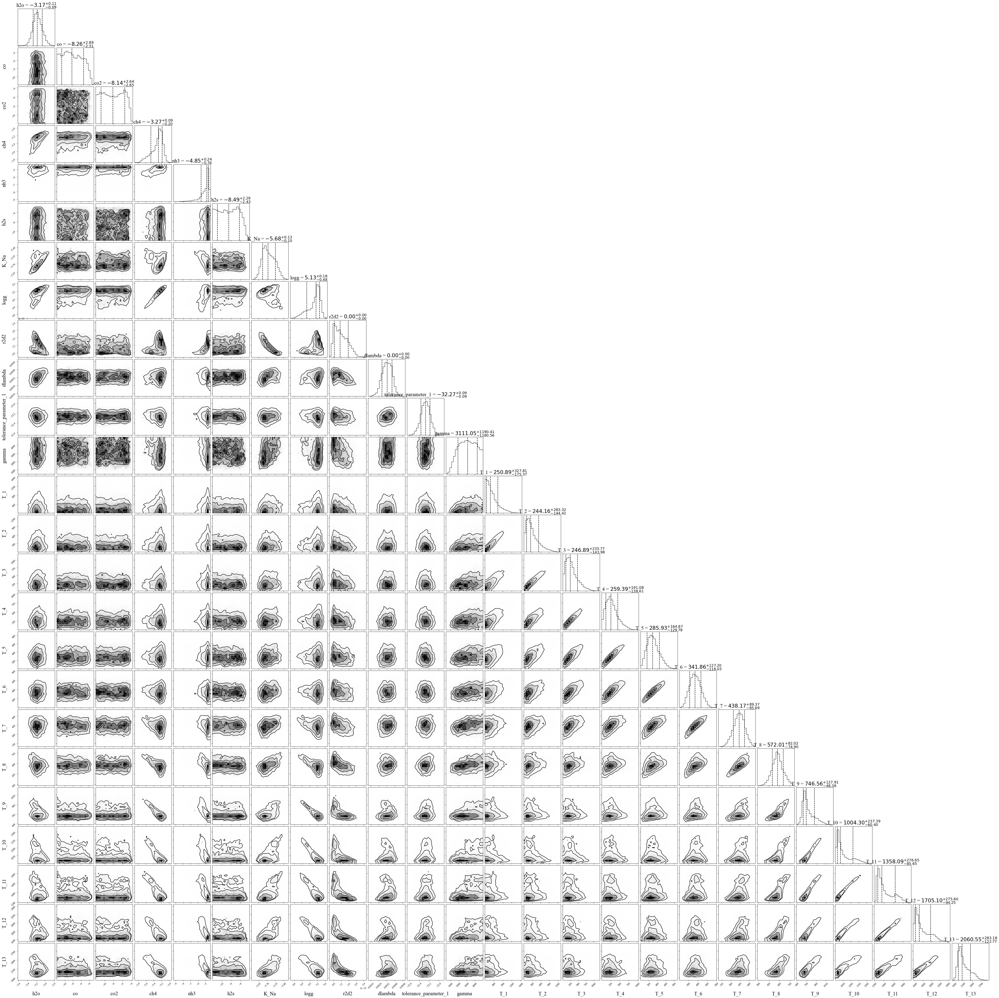

In [8]:
fig = corner.corner(samples,scale_hist=False,plot_datapoints =False,\
                    labels=all_params,\
                    quantiles=[0.16, 0.5, 0.84],show_titles=True, title_kwargs={"fontsize": 20},\
                    label_kwargs={"fontsize": 20})

In [9]:
#get diagnostics along with the spectrum
gnostics = 0
# Now run the model again to get your model spectrum and process to make it look like the data
shiftspec, photspec, tauspec,cfunc = test_module.modelspec(theta_max_end,re_params,runargs,gnostics)
topspec = brewtools.proc_spec(shiftspec,theta_max_end,runargs.fwhm,runargs.chemeq,runargs.gasnum,runargs.obspec) 

In [10]:
# Now grab 500 random draws from the posterior
pltspec = np.zeros((500,runargs.obspec[0,:].size))
samp= np.empty(ndim)
samples = flatendchain
sid = np.zeros(500)
for i in range (0,500):
    sid[i]= np.random.randint(0,high = len(samples))
    samp = samples[int(sid[i]),:]
    
    shiftspec, photspec, tauspec,cfunc = test_module.modelspec(samp,re_params,runargs,gnostics)
    pltspec[i,:] = brewtools.proc_spec(shiftspec,samp,runargs.fwhm,runargs.chemeq,runargs.gasnum,runargs.obspec) 

# get the intervals for the distribution of model spectra
specdist = np.empty([runargs.obspec[0].size,5])
for i in range(0,runargs.obspec[0].size):
    junk = pltspec[:,i]
    junk2 = np.percentile(junk, [2.4,16, 50, 84,97.6],axis=0)
    junk3 = np.array(junk2)
    specdist[i,:] = junk3[:]


Text(0.5, 0, 'Wavelength / $\\mu m$')

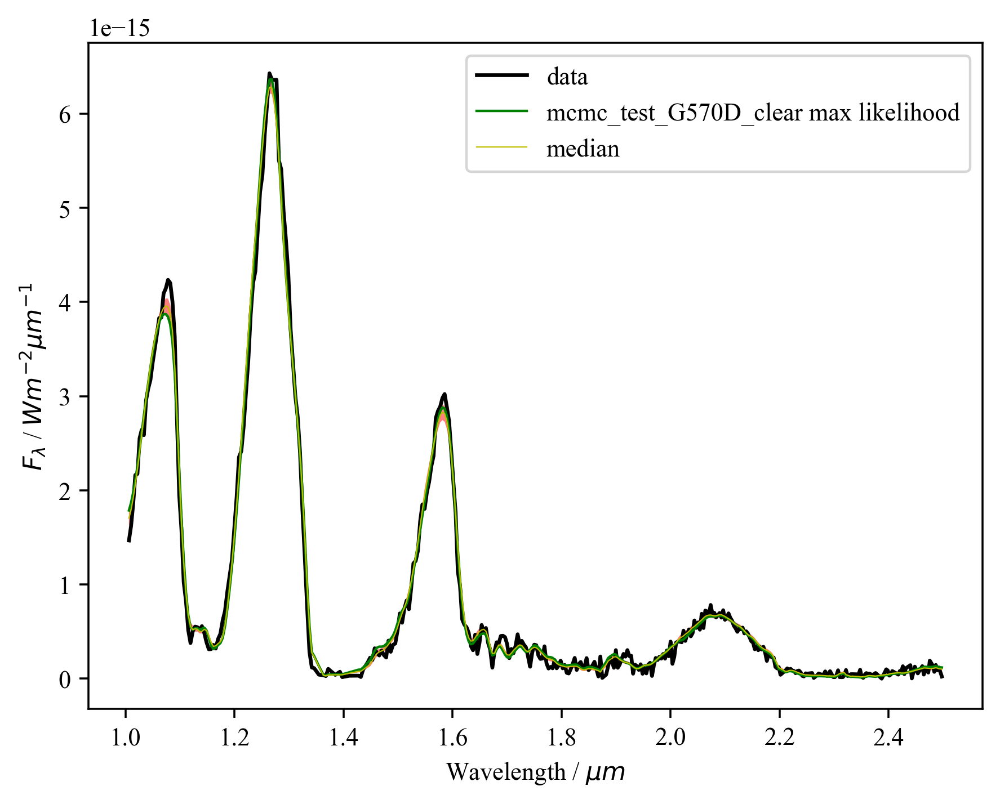

In [11]:
# plot the spectra
plt.rc('font',family='Times New Roman')
fig=plt.figure(dpi=320)


d1, = plt.plot(runargs.obspec[0,:],runargs.obspec[1,:],'k-',label = "data")
t1, = plt.plot(runargs.obspec[0,:],topspec,'g-',linewidth=1, label = runname+" max likelihood")

r1, = plt.plot(runargs.obspec[0],specdist[:,2],'y-',linewidth=0.5, label = "median")
#plt.fill_between(obspec[0],specdist[:,0],specdist[:,4],facecolor='red',alpha=0.2)
plt.fill_between(runargs.obspec[0],specdist[:,1],specdist[:,3],facecolor='red',alpha=0.5)
#plt.fill_between(obspec[0,:],obspec[1,:]-obspec[2,:],obspec[1,:]+obspec[2,:],facecolor='red',alpha=0.2)


plt.legend(handles=[d1,t1,r1])


plt.ylabel(r'$ F_{\lambda}$ / $Wm^{-2} \mu m^{-1}$')
plt.xlabel('Wavelength / $\mu m$')
#plt.savefig(runname+"_SPAG_SPEC.png",format='png', dpi=320))

# Multinest

In [16]:
from pymultinest.analyse import Analyzer

path = "/Users/fw23aao/brewsteretrieval/data/multinest_test_G570D/"
runname ="multinest_test_G570D_clear"

argfile =path+runname+"_runargs.pic"
runargs = brewtools.pickle_load(argfile)
settings.init(runargs)

with open(path+runname+'_configs.pkl', 'rb') as file:
    configs= pickle.load(file)
    
re_params=configs['re_params']

all_params,all_params_values =utils.get_all_parametres(re_params.dictionary) 
ndim=len(all_params)

a = Analyzer(ndim, outputfiles_basename = path+runname)
stats = a.get_stats()
bestfit_params = a.get_best_fit()
print(bestfit_params)

  analysing data from /Users/fw23aao/brewsteretrieval/data/multinest_test_G570D/multinest_test_G570D_clear.txt
{'log_likelihood': 4316.914371159494, 'parameters': [-3.232175987895587, -6.60716454305887, -5.147016724335605, -3.2661047590753207, -4.591429809473437, -5.582655296871568, -5.763792718222608, 76.89777760242458, 1.0831481991773604, 0.0028745400750684567, -32.32166006023078, 1299.7399645977382, 9.08451455951957, 50.22304831713967, 103.92824904435919, 167.75645537643453, 241.90507076767523, 309.26774706193225, 407.80513867363584, 524.8425272578402, 680.4939465376215, 922.7145485570285, 1230.3603427408239, 1574.6999444878004, 1930.2277120010933]}


In [17]:
theta_max = np.array(bestfit_params['parameters'])
max_like = bestfit_params['log_likelihood']
tmp = a.get_equal_weighted_posterior()
samples = tmp[:,:(tmp.shape[1]-1)]

In [18]:
params_instance 

params(h2o=-3.2497557137267488, co=-10.896614730351242, co2=-5.590736698449257, ch4=-3.2279274326698117, nh3=-4.545518929140154, h2s=-6.809939776564168, K_Na=-5.785425735020168, logg=5.193127131340521, r2d2=1.7799654920538786e-19, dlambda=0.002707958633071575, tolerance_parameter_1=-32.32589686652599, gamma=1357.374981633195, T_1=23.99297194093299, T_2=22.085610899477132, T_3=28.589669756512563, T_4=70.6754682359463, T_5=116.87803059875256, T_6=193.15318501942917, T_7=295.53903447330407, T_8=471.80806297297676, T_9=685.7040756983204, T_10=939.0683772847233, T_11=1255.0818687125713, T_12=1588.4852117129822, T_13=1905.2836504690022)

In [19]:
params_master = namedtuple('params',all_params)
params_instance = params_master(*theta_max)

intemp_keys = list(re_params.dictionary['pt']['params'].keys())

if runargs.proftype==1 or runargs.proftype==77:
    p_index_first=params_instance._fields.index(intemp_keys[1]) 
else:
    p_index_first=params_instance._fields.index(intemp_keys[0]) 
    
p_index_last=params_instance._fields.index(intemp_keys[-1])+1

Tsamples = samples[:,p_index_first:p_index_last]
nsamps = Tsamples.shape[0]
nlayers = len(runargs.press)
Tprofs = np.empty([64,Tsamples.shape[0]])
for i in range(0,nsamps):
    Tprofs[:,i] = TPmod.set_prof(runargs.proftype,runargs.coarsePress,runargs.press,Tsamples[i,:])
    
Tlays = np.empty([nlayers,5])
for i in range(0,nlayers):
    junk = Tprofs[i,:]
    junk2 = np.percentile(junk, [2.4,16, 50, 84,97.6],axis=0)
    junk3 = np.array(junk2)
    Tlays[i,:] = junk3[:]

Text(0.5, 0, 'T / K')

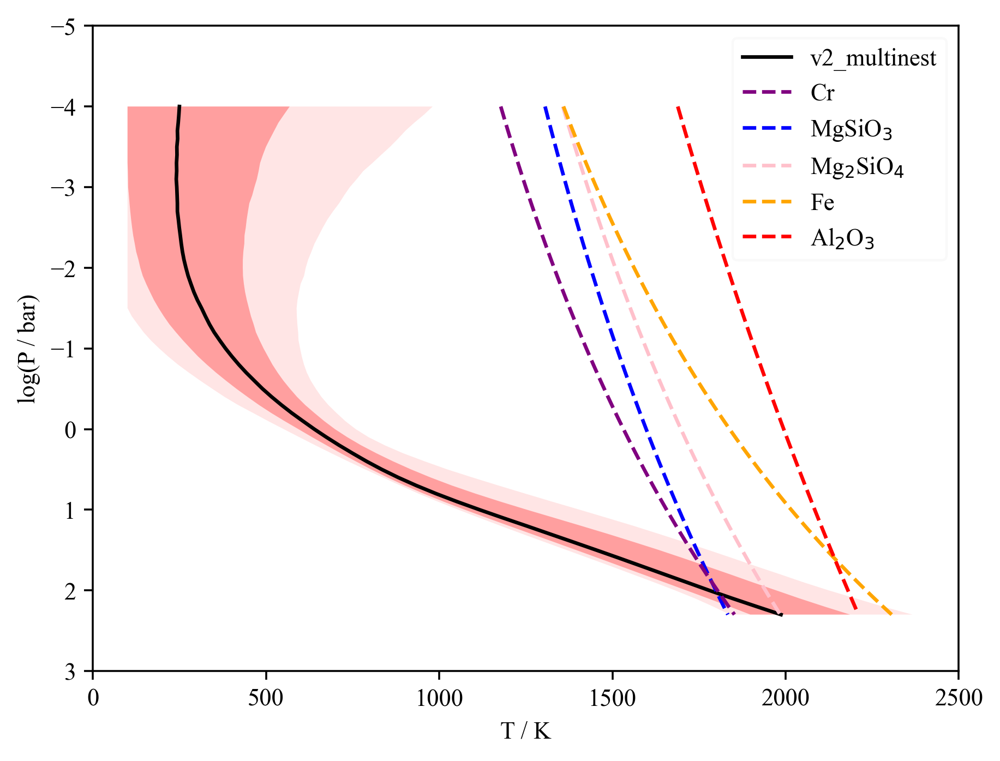

In [20]:
plt.rc('font',family='Times New Roman')
fig=plt.figure(dpi=320)
plt.axis([0., 2500.,3.0,-5.0])

logP = np.log10(runargs.press)

d1, = plt.plot(Tlays[:,2],logP,'k-',label=r"v2_multinest")
plt.fill_betweenx(logP,Tlays[:,1], Tlays[:,3], facecolor='red', alpha=0.3)
plt.fill_betweenx(logP,Tlays[:,0], Tlays[:,4], facecolor='red', alpha=0.1)


# Here are some condensation curves
enst = 10.0**4/(6.26 - 0.35*logP-0.70*0.0)
fost = 10.0**4/(5.89 - 0.37*logP-0.73*0.0)
iron = 10.0**4/(5.44 - 0.48*logP-0.48*0.0)
cr =  10.0**4/(6.528 - 0.491*logP-0.491*0.0)
al2o3 = 10.0**4 / (5.0139 - 0.21794*(logP) + 2.2636E-03*(logP)**2.0 - 0.580*0.0)
c1, = plt.plot(enst,logP,'--',color='blue',linewidth=1.5, label='MgSiO$_3$')
c2, = plt.plot(fost,logP,'--',color='pink',linewidth=1.5,label='Mg$_2$SiO$_4$')
c3, = plt.plot(iron,logP,'--',color='orange',linewidth=1.5, label='Fe')
c4, = plt.plot(cr,logP,'--',color='purple',linewidth=1.5, label='Cr')
c5, = plt.plot(al2o3,logP,'--',color='red',linewidth=1.5, label='Al$_2$O$_3$')

# plt.legend(handles=[d1,d2,c4,c1,c2,c3,c5])

plt.legend(handles=[d1,c4,c1,c2,c3,c5],framealpha=0.1)
plt.ylabel(r'log(P / bar)')
plt.xlabel('T / K')

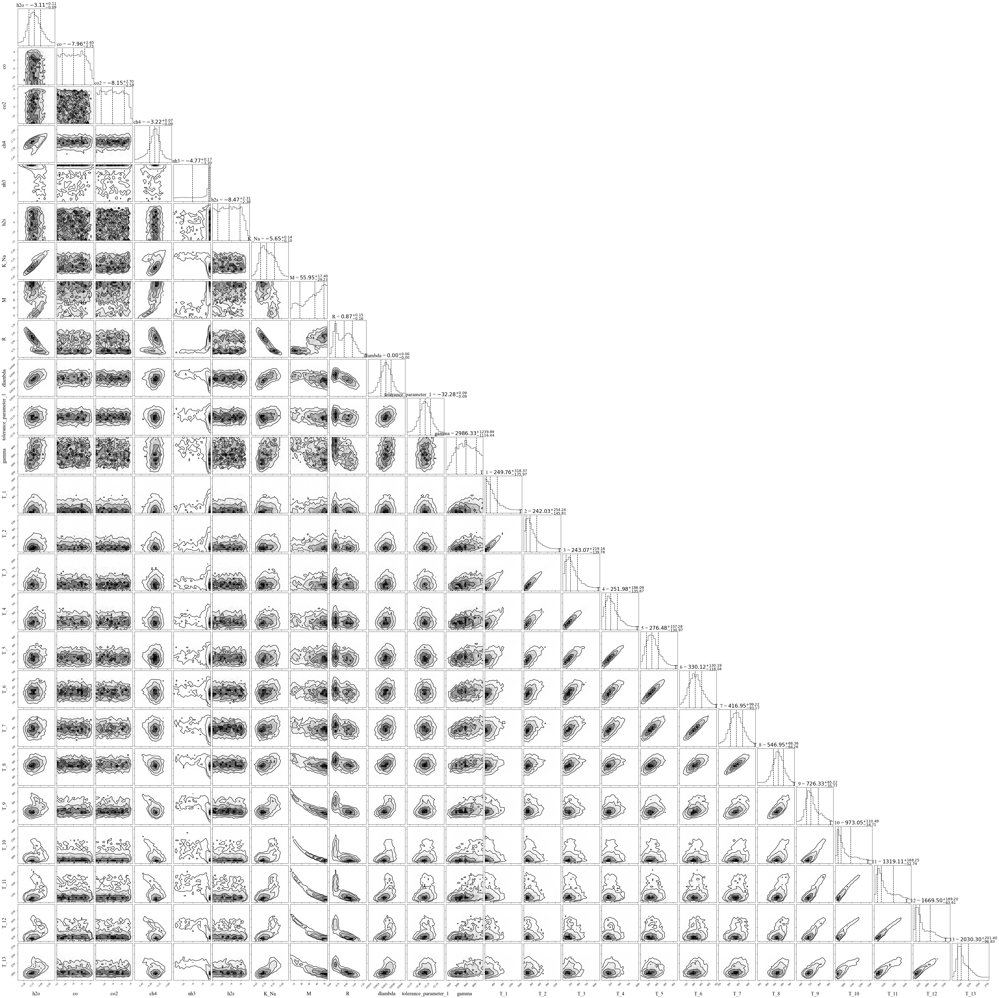

In [21]:
fig = corner.corner(samples,scale_hist=True,plot_datapoints =False,labels=all_params,\
                    quantiles=[0.16, 0.5, 0.84],show_titles=True, title_kwargs={"fontsize": 20},\
                    label_kwargs={"fontsize": 20})

In [22]:
#get diagnostics along with the spectrum
gnostics = 0
# Now run the model again to get your model spectrum and process to make it look like the data
shiftspec, photspec, tauspec,cfunc = test_module.modelspec(params_instance,re_params,runargs,gnostics)
topspec = brewtools.proc_spec(shiftspec,theta_max_end,runargs.fwhm,runargs.chemeq,runargs.gasnum,runargs.obspec) 

In [23]:
# Now grab 500 random draws from the posterior
pltspec = np.zeros((500,runargs.obspec[0,:].size))
samp= np.empty(ndim)
samples = flatendchain
sid = np.zeros(500)
for i in range (0,500):
    sid[i]= np.random.randint(0,high = len(samples))
    samp = samples[int(sid[i]),:]
    
    shiftspec, photspec, tauspec,cfunc = test_module.modelspec(samp,re_params,runargs,gnostics)
    pltspec[i,:] = brewtools.proc_spec(shiftspec,samp,runargs.fwhm,runargs.chemeq,runargs.gasnum,runargs.obspec) 

# get the intervals for the distribution of model spectra
specdist = np.empty([runargs.obspec[0].size,5])
for i in range(0,runargs.obspec[0].size):
    junk = pltspec[:,i]
    junk2 = np.percentile(junk, [2.4,16, 50, 84,97.6],axis=0)
    junk3 = np.array(junk2)
    specdist[i,:] = junk3[:]


Text(0.5, 0, 'Wavelength / $\\mu m$')

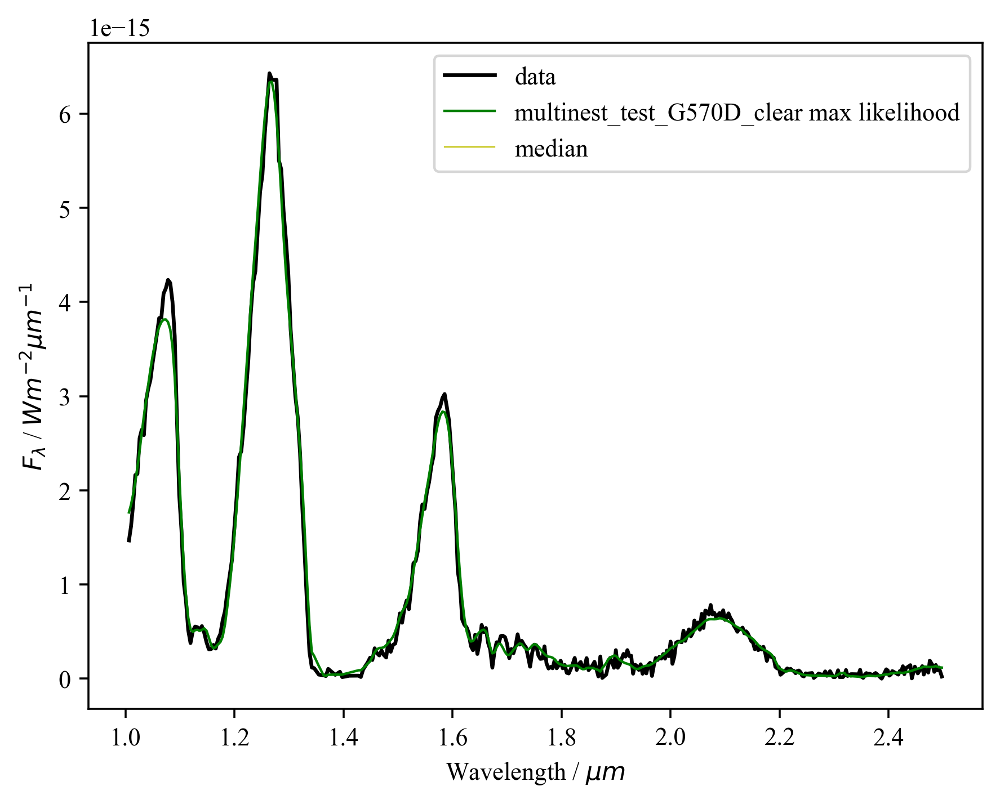

In [24]:
# plot the spectra
plt.rc('font',family='Times New Roman')
fig=plt.figure(dpi=320)


d1, = plt.plot(runargs.obspec[0,:],runargs.obspec[1,:],'k-',label = "data")
t1, = plt.plot(runargs.obspec[0,:],topspec,'g-',linewidth=1, label = runname+" max likelihood")

r1, = plt.plot(runargs.obspec[0],specdist[:,2],'y-',linewidth=0.5, label = "median")
#plt.fill_between(obspec[0],specdist[:,0],specdist[:,4],facecolor='red',alpha=0.2)
plt.fill_between(runargs.obspec[0],specdist[:,1],specdist[:,3],facecolor='red',alpha=0.5)
#plt.fill_between(obspec[0,:],obspec[1,:]-obspec[2,:],obspec[1,:]+obspec[2,:],facecolor='red',alpha=0.2)


plt.legend(handles=[d1,t1,r1])


plt.ylabel(r'$ F_{\lambda}$ / $Wm^{-2} \mu m^{-1}$')
plt.xlabel('Wavelength / $\mu m$')
#plt.savefig(runname+"_SPAG_SPEC.png",format='png', dpi=320))